In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.display.float_format = '{:.6f}'.format  

# 그래프에서 한글 깨짐 방지
import platform
if platform.system() == "Darwin":          # MAC인 경우
    plt.rc('font', family ="AppleGothic")
else:
    plt.rc('font',family='Malgun Gothic')

#멧플로립에서 음수를 표시
plt.rc('axes',unicode_minus=False)

#워닝 메시지
import warnings
warnings.filterwarnings('ignore')

In [90]:
df=pd.read_csv('./datasets/피쳐선정전data.csv',encoding='euc-kr',index_col=0)
df

,재고순환지표(%p),경제심리지수,기계류내수출하지수(선박제외)(2020=100),건설수주액(실질)(십억원),수출입물가비율(2015=100),코스피(1980.1.4=100),장단기금리차(%p),외환보유액,뉴스심리지수,원/달러,...,WTI유,G7,G20,미장단기,거래량,종가,구리,천연가스,은,금
Date,,,,,,,,,,,,,,,,,,,,,
2008-01,5.000000,112.100000,98.500000,10384.800000,105.100000,1853.700000,0.670000,"261,870,733",98.540000,936.800000,...,26.816444,101.323600,101.558900,1.030000,11548.000000,1000.000000,3.064000,7.850000,15.290000,860.000000
2008-02,3.900000,112.000000,98.400000,9246.100000,103.700000,1775.300000,0.530000,"262,364,808",97.880000,944.100000,...,26.276930,101.179200,101.286800,1.530000,13564.000000,897.970000,3.273000,7.740000,16.916000,913.500000
2008-03,3.200000,110.500000,98.400000,9434.400000,102.200000,1691.000000,0.310000,"264,245,660",88.120000,946.700000,...,26.771666,101.002700,100.974300,1.930000,9948.000000,873.820000,3.928500,9.346000,20.180000,984.200000
2008-04,0.400000,109.400000,98.900000,10121.700000,100.700000,1705.800000,0.140000,"260,482,546",103.730000,983.500000,...,27.311699,100.772900,100.601400,1.770000,13964.000000,965.780000,3.806500,9.724000,16.935000,887.800000
2008-05,-1.600000,106.100000,98.500000,9955.600000,98.600000,1758.200000,0.220000,"258,198,958",93.060000,1009.100000,...,25.481760,100.458300,100.145200,1.410000,16690.000000,1056.740000,3.694500,10.561000,16.205000,850.900000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12,-10.400000,92.700000,115.400000,10568.500000,85.200000,2336.400000,0.840000,"423,163,664",83.390000,1304.210000,...,76.773430,98.702760,98.935240,-0.720000,8411.000000,1435.740000,3.817500,6.738000,22.841000,1815.200000
2023-01,-15.400000,90.900000,111.200000,13969.700000,85.100000,2380.400000,0.450000,"429,967,671",93.790000,1269.020000,...,78.254589,98.721420,98.971380,-0.610000,10487.000000,1343.910000,3.795250,4.273500,24.328000,1835.800000
2023-02,-16.200000,91.100000,106.900000,14725.600000,84.600000,2391.300000,0.180000,"425,286,150",97.480000,1221.780000,...,74.513809,98.740730,99.024580,-0.700000,9732.000000,1439.490000,4.111000,2.468000,23.609000,1927.800000


In [91]:
df['외환보유액']=df['외환보유액'].apply(lambda x: x.replace(',','')).astype('float')

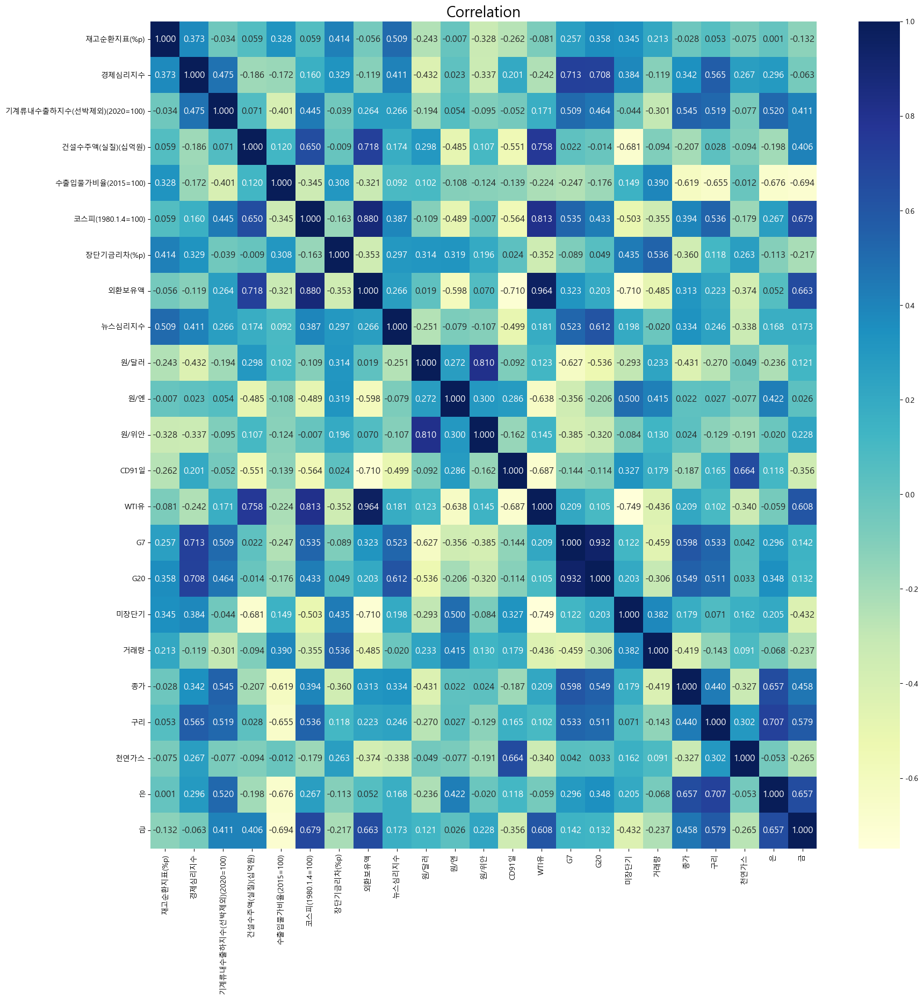

In [92]:
fig,ax= plt.subplots(1,1,figsize=(20,20),sharey=True)

sns.heatmap(df.corr(), annot=True,fmt='.3f' ,annot_kws={'size':12}, cmap="YlGnBu")
plt.title('Correlation', fontsize=20)
plt.show()

In [93]:
df2=df.drop(['G7','WTI유','원/위안','은'],axis=1)
#### 이렇게 삭제하면 corr관계에서는 경제심리지수, 코스피 관계만 0.7이 넘는다(0.708)

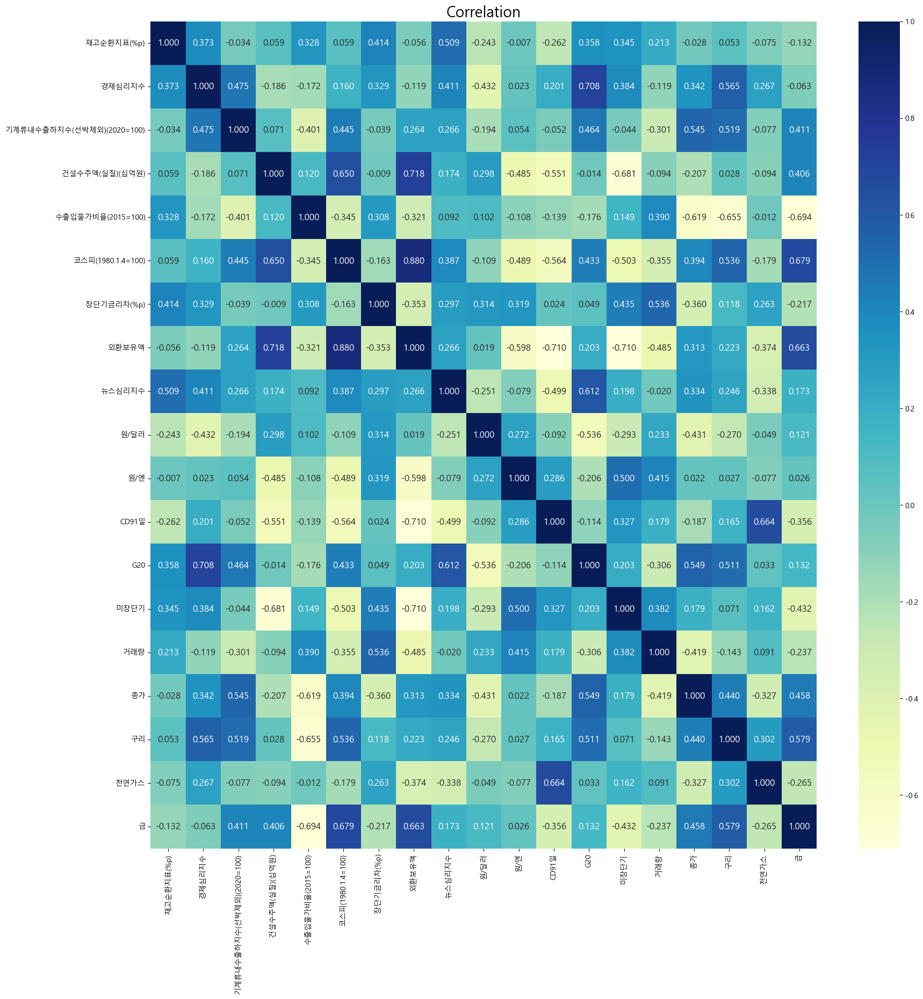

In [94]:
fig,ax= plt.subplots(1,1,figsize=(20,20),sharey=True)

sns.heatmap(df2.corr(), annot=True,fmt='.3f' ,annot_kws={'size':12}, cmap="YlGnBu")
plt.title('Correlation', fontsize=20)
plt.show()



In [95]:
### H0가 비정상(non-stationary)이다
### 유의수준보다 p-value가 작으면 기각 --> 정상적 데이터다

from statsmodels.tsa.stattools import adfuller
import pandas as pd
pd.options.display.float_format = '{:.6f}'.format

adf_df = pd.DataFrame()  # 빈 데이터프레임 생성

for i in df2.columns:
    adf_sample = adfuller(df2[i], autolag='AIC')
    
    adf_result = pd.Series(adf_sample[:4], index=['stat', 'p_value', 'lag', 'observ'])
    sig_level = adf_sample[4]['5%']
    adf_result['5%'] = sig_level
    
    adf_df[i] = adf_result  # 결과를 데이터프레임에 열(column)로 추가

adf_df = adf_df.transpose()  # 행(row)과 열(column)을 전환하여 변환
adf_df

,stat,p_value,lag,observ,5%
재고순환지표(%p),-2.783690,0.060641,13.000000,170.000000,-2.878696
경제심리지수,-3.552008,0.006748,11.000000,172.000000,-2.878495
기계류내수출하지수(선박제외)(2020=100),-3.438825,0.009704,11.000000,172.000000,-2.878495
건설수주액(실질)(십억원),-1.347808,0.607026,13.000000,170.000000,-2.878696
수출입물가비율(2015=100),-3.072674,0.028643,13.000000,170.000000,-2.878696
코스피(1980.1.4=100),-2.039180,0.269662,13.000000,170.000000,-2.878696
장단기금리차(%p),-3.248320,0.017353,13.000000,170.000000,-2.878696
외환보유액,-3.124861,0.024767,13.000000,170.000000,-2.878696
뉴스심리지수,-5.673826,0.000001,12.000000,171.000000,-2.878595
원/달러,-3.574256,0.006273,0.000000,183.000000,-2.877467


In [96]:
statics=df2.aggregate([min,  
                np.mean,  
                np.std,  
                np.median,  
                max]  
).T.round(2)
statics['Var']= statics['std']**2

In [97]:
statics

,min,mean,std,median,max,Var
재고순환지표(%p),-24.900000,-2.880000,8.440000,-4.500000,31.300000,71.233600
경제심리지수,64.300000,98.220000,9.710000,97.750000,115.900000,94.284100
기계류내수출하지수(선박제외)(2020=100),85.300000,104.080000,7.550000,102.150000,119.600000,57.002500
건설수주액(실질)(십억원),5352.400000,10623.160000,3235.480000,10493.050000,17969.600000,10468330.830400
수출입물가비율(2015=100),83.600000,93.970000,6.470000,94.250000,107.600000,41.860900
코스피(1980.1.4=100),1115.100000,2083.170000,411.050000,2011.250000,3232.100000,168962.102500
장단기금리차(%p),-0.250000,0.800000,0.760000,0.640000,2.900000,0.577600
외환보유액,200505915.000000,355816400.170000,66415471.300000,368288515.500000,469207742.000000,4411014828001123.500000
뉴스심리지수,60.040000,99.450000,10.370000,100.780000,119.420000,107.536900
원/달러,936.800000,1147.400000,88.070000,1128.380000,1570.200000,7756.324900


In [98]:
df2.columns

Index(['재고순환지표(%p)', '경제심리지수', '기계류내수출하지수(선박제외)(2020=100)', ' 건설수주액(실질)(십억원)',
       '수출입물가비율(2015=100)', '코스피(1980.1.4=100)', ' 장단기금리차(%p)', '외환보유액',
       '뉴스심리지수', '원/달러', '원/엔', 'CD91일', 'G20', '미장단기', '거래량', '종가', '구리',
       '천연가스', '금'],
      dtype='object')

## EDA

* 경제심리지수, 기계류내수출, 수출입 물가 , 장단기 금리차, 외환보유액, 뉴스심리지수,원/달러, G20, 천연가스--> 정상적인 데이터
1. 건설수주액, 코스피, 외환보유액, 거래량, 종가, 금 -- > 로그 
2. 재고 순환표, 원/엔, CD 91일 , 구리, 미 장단기

In [99]:
df2[' 건설수주액(실질)(십억원)']=np.log(df2[' 건설수주액(실질)(십억원)']/df2[' 건설수주액(실질)(십억원)'].shift(1)) 
df2['코스피(1980.1.4=100)']=np.log(df2['코스피(1980.1.4=100)']/df2['코스피(1980.1.4=100)'].shift(1))
df2['외환보유액']=np.log(df2['외환보유액']/df2['외환보유액'].shift(1))
df2['거래량']=np.log(df2['거래량']/df2['거래량'].shift(1))
df2['종가']=np.log(df2['종가']/df2['종가'].shift(1))
df2['금']=np.log(df2['금']/df2['금'].shift(1))


In [100]:
df2['재고순환지표(%p)']=df2['재고순환지표(%p)'].diff(1)
df2['미장단기']=df2['미장단기'].diff(1)
df2['원/엔']=df2['원/엔'].diff(1)
df2['CD91일']=df2['CD91일'].diff(1)
df2['구리']=df2['구리'].diff(1)


In [101]:
df2=df2.fillna(method='bfill')

In [102]:
### H0가 비정상(non-stationary)이다
### 유의수준보다 p-value가 작으면 기각 --> 정상적 데이터다

from statsmodels.tsa.stattools import adfuller
import pandas as pd
pd.options.display.float_format = '{:.6f}'.format

adf_df = pd.DataFrame()  # 빈 데이터프레임 생성

for i in df2.columns:
    adf_sample = adfuller(df2[i], autolag='AIC')
    
    adf_result = pd.Series(adf_sample[:4], index=['stat', 'p_value', 'lag', 'observ'])
    sig_level = adf_sample[4]['5%']
    adf_result['5%'] = sig_level
    
    adf_df[i] = adf_result  # 결과를 데이터프레임에 열(column)로 추가

adf_df = adf_df.transpose()  # 행(row)과 열(column)을 전환하여 변환
adf_df

,stat,p_value,lag,observ,5%
재고순환지표(%p),-5.018356,0.000020,12.000000,171.000000,-2.878595
경제심리지수,-3.552008,0.006748,11.000000,172.000000,-2.878495
기계류내수출하지수(선박제외)(2020=100),-3.438825,0.009704,11.000000,172.000000,-2.878495
건설수주액(실질)(십억원),-3.397132,0.011057,12.000000,171.000000,-2.878595
수출입물가비율(2015=100),-3.072674,0.028643,13.000000,170.000000,-2.878696
코스피(1980.1.4=100),-5.931747,0.000000,10.000000,173.000000,-2.878396
장단기금리차(%p),-3.248320,0.017353,13.000000,170.000000,-2.878696
외환보유액,-7.516544,0.000000,10.000000,173.000000,-2.878396
뉴스심리지수,-5.673826,0.000001,12.000000,171.000000,-2.878595
원/달러,-3.574256,0.006273,0.000000,183.000000,-2.877467


In [103]:
import statsmodels.api as sm
from statsmodels.tsa.api import VAR

model_var = VAR(endog=df2)             ## X_train을 endogenous 변수로 설정한 후
res = model_var.select_order(6)            ## select_order 메서드를 호출하여 최적의 차수를 선택, select_order 메서드는 다양한 정보 기준(AIC, BIC, HQIC)을 사용하여 최적의 모델 차수를 추정
res.summary()  

,AIC,BIC,FPE,HQIC
0,-22.78,-22.44,1.284e-10,-22.64
1,-43.31,-36.51*,1.586e-19,-40.55*
2,-45.15,-31.90,2.839e-20,-39.77
3,-46.11,-26.41,1.510e-20,-38.12
4,-47.03,-20.88,1.199e-20,-36.42
5,-48.88,-16.27,6.707e-21,-35.66
6,-51.42*,-12.36,4.907e-21*,-35.58


#### maxlag=2

In [104]:
model_fit = model_var.fit(maxlags=2, ic='aic')         ## maxlags 매개변수를 통해 모델의 최대 시차(lag)를 설정하고, 
model_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 17, Jun, 2023
Time:                     16:54:25
--------------------------------------------------------------------
No. of Equations:         19.0000    BIC:                   -31.4759
Nobs:                     182.000    HQIC:                  -39.2326
Log likelihood:          -114.295    FPE:                5.25441e-20
AIC:                     -44.5208    Det(Omega_mle):     1.31349e-21
--------------------------------------------------------------------
Results for equation 재고순환지표(%p)
                                  coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------------------
const                              -10.640438        21.208847           -0.502           0.616
L1.재고순환지표(%p)                        0.714942         0.085499            8.362           0

- 경제 심리지수(diff1)
- 기계류내수출하지수(diff2)
- 수출입물가비율(diff1,diff2)
- 코스피(diff1)
- CD91일(diff2)
- 구리(diff1) 
- 미장단기(diff1)

#### var모델에서 나온거고, 정상성을 맞출려고 처음에 차분 한번했으니까, 위에 써져있는 차분에 +1을 한 차분이다

- VIR모델을 이용해서 종가에 영향을 주는 7개의 피쳐를 선정했음
- 우리가 말했던대로, 원본의 7개의 피쳐로 Eviews를 이용하여 요한슨 공적분검정을 해봤더네 -> 1개만 공적분 관계가 있다 -> VECM모델 사용할 수 없다
- 혹시나 몰라서, 정상성이 확보된 7개의 피쳐로 Eviews를 이요하여 요한슨 공적분검정 -> 5개가 공적분 관계가 있다 -> 유의 수준 0.07로 올리면 피쳐 7개로 VECM모델 사용 가능
- 고려할 사항 
    1. 전처리한 데이터를 가지고 VAR모델을 이용
    2. 전처리한 데이터를 가지고 VECM모델을 이용
 

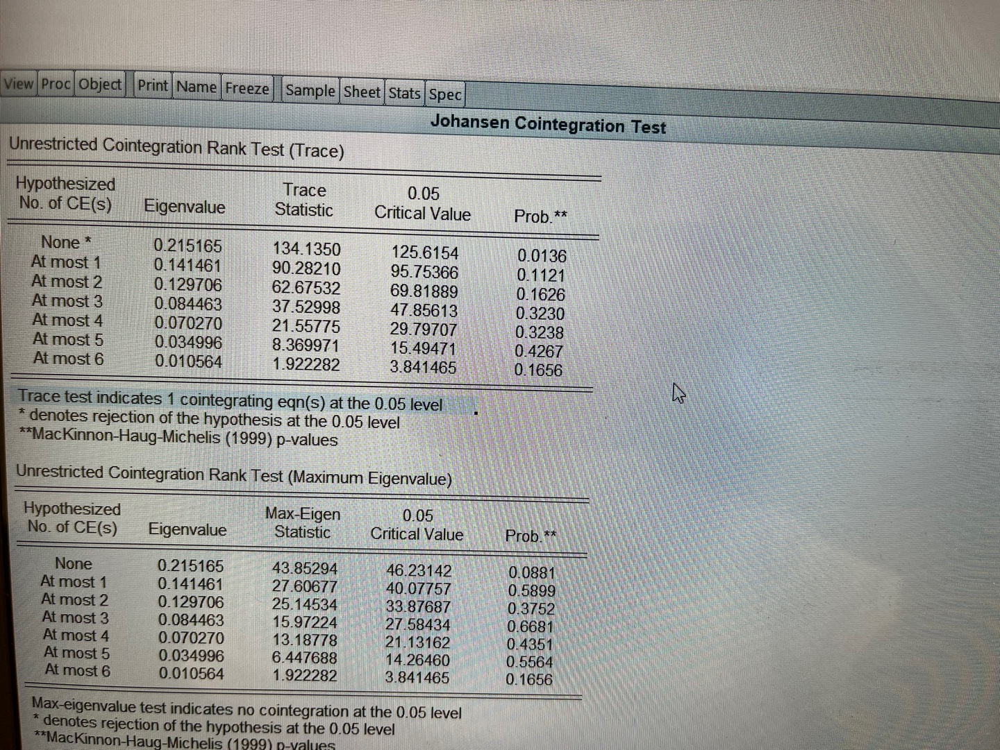

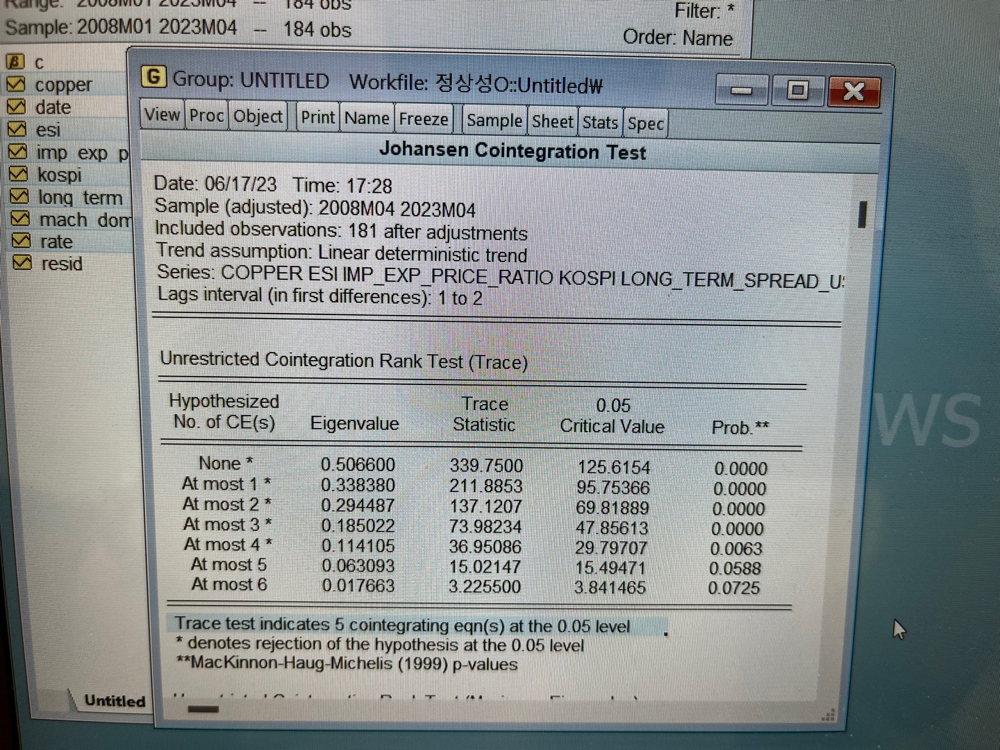